In [1]:
##Folder to print results
folder_results = "Results_multiple/NantesTN_TX"
folder_station = "../mystations"
##Station
file = [folder_station * "/" * typedata * "_Nantes.txt" for typedata in ["TN", "TX"]]

##AR model
p = 3
method_ = "monthly"
periodicity_model = "trigo"       # "trigo", "smooth", "autotrigo", "stepwise_trigo"
degree_period = 2                     # 0 => default value -> "trigo" : 5, "smooth" : 9, "autotrigo" : 50, "stepwise_trigo" : 50
Trendtype = "LOESS"                   # "LOESS", "polynomial", "null" (for no additive trend)
trendparam = nothing                  # nothing => default value -> "LOESS" : 0.08, "polynomial" : 1
σ_periodicity_model = "trigo"     # "trigo", "smooth", "autotrigo", "stepwise_trigo", "null" (for no multiplicative periodicity)
σ_degree_period = 2                   # 0 => default value -> "trigo" : 5, "smooth" : 9, "autotrigo" : 50, "stepwise_trigo" : 50
σ_Trendtype = "LOESS"                 # "LOESS", "polynomial", "null" (for no multiplicative trend)
σ_trendparam = nothing                # nothing => default value -> "LOESS" : 0.08, "polynomial" : 1

##Simulations
n = 1000

1000

In [2]:
include("table_reader.jl")
include("utils/Missing_values.jl")
include("utils/Structure.jl")
include("utils/Plotting.jl")
cd(@__DIR__)

In [3]:
settings = OrderedDict((("file", file),
    ("p", p),
    ("method_", method_),
    ("periodicity_model", periodicity_model),
    ("degree_period", degree_period),
    ("Trendtype", Trendtype),
    ("trendparam", trendparam),
    ("σ_periodicity_model", σ_periodicity_model),
    ("σ_degree_period", σ_degree_period),
    ("σ_Trendtype", σ_Trendtype),
    ("σ_trendparam", σ_trendparam),
    ("n", n)))

OrderedDict{String, Any} with 12 entries:
  "file"                => ["../mystations/TN_Nantes.txt", "../mystations/TX_Na…
  "p"                   => 3
  "method_"             => "monthly"
  "periodicity_model"   => "trigo"
  "degree_period"       => 2
  "Trendtype"           => "LOESS"
  "trendparam"          => nothing
  "σ_periodicity_model" => "trigo"
  "σ_degree_period"     => 2
  "σ_Trendtype"         => "LOESS"
  "σ_trendparam"        => nothing
  "n"                   => 1000

In [4]:
series_vec = truncate_MV.(extract_series.(file))
date_vec, x = Common_indexes(series_vec)

Caracteristics_Series_vec = init_CaracteristicsSeries.(series_vec)

2-element Vector{CaracteristicsSeries}:
 CaracteristicsSeries([3.2470588235294113, 3.9411764705882355, 3.3588235294117648, 3.414705882352941, 3.711764705882353, 3.258823529411765, 3.035294117647059, 4.385294117647059, 3.8676470588235294, 3.8794117647058823  …  5.554545454545453, 4.866666666666667, 5.081818181818181, 4.803030303030304, 3.5212121212121215, 3.16060606060606, 2.8515151515151516, 2.5606060606060606, 3.5878787878787874, 4.172727272727272], [12.1, 11.5, 11.5, 11.2, 11.7, 11.3, 10.7, 11.0, 12.1, 12.0  …  13.4, 13.0, 11.8, 11.3, 11.4, 10.6, 12.3, 11.3, 12.2, 14.3], 12×4 DataFrame
 Row │ MONTH  MONTHLY_MEAN  MONTHLY_STD  MONTHLY_MAX 
     │ Int64  Float64       Float64      Float64     
─────┼───────────────────────────────────────────────
   1 │     1       3.36195      4.40412         12.8
   2 │     2       3.38714      4.12052         12.6
   3 │     3       4.9262       3.59028         12.6
   4 │     4       6.60465      3.25887         15.0
   5 │     5       9.90225     

In [5]:
# Model = fit_Multi_AR(x, date_vec,
#     p=p,
#     method_=method_,
#     periodicity_model=periodicity_model,
#     degree_period=degree_period,
#     Trendtype=Trendtype,
#     trendparam=trendparam,
#     σ_periodicity_model=σ_periodicity_model,
#     σ_degree_period=σ_degree_period,
#     σ_Trendtype=σ_Trendtype,
#     σ_trendparam=σ_trendparam)
    
# save_model(Model, folder_results * "/model.jld2")

Model = load_model(folder_results * "/modelNantesnTN_TX_p3_k4.jld2")

Multi_MonthlyAR([[[0.2954736741199587 0.6184334324914657; -0.012694208482122538 0.7943430748889291], [-0.018762327132961287 -0.11648122331874745; -0.006327558787439487 -0.00534389752502849], [0.0035635539447373657 -0.0033770191949886955; -0.027189535766666162 0.037954502219191874]], [[0.3972448505233908 0.4750894796900935; -0.052677216408535794 0.7595594585694304], [0.03294682563997394 -0.11076813059203543; -0.00922385112574573 0.029992636682477276], [0.02344851147905194 -0.034828743525768334; 0.021418457880585856 0.04684426144158257]], [[0.42891877651613447 0.3999600763196947; -0.007147089465150575 0.6771884224045405], [0.04924054095322716 -0.084245765218093; -0.06275765173729188 0.030955963687808338], [0.009002680352368822 -0.016996597174031205; 0.01937915255713313 0.03132446895420331]], [[0.4339959642971792 0.4030195632749754; 0.04131997742221051 0.7545397913946558], [-0.027972862016738976 -0.046464189700053775; 0.019778272853522728 -0.11545728901710034], [0.059684518135726485 -0.08

In [6]:
sample_ = rand(Model, n)

1000-element Vector{Matrix{Float64}}:
 [0.9000000000000004 4.4; -1.4000000000000004 3.199999999999999; … ; -5.109533040965391 5.72116515326053; -0.9800041996177531 4.21228855424372]
 [0.9000000000000004 4.4; -1.4000000000000004 3.199999999999999; … ; 7.142869571650847 9.550294192642077; 3.6493871452872617 10.260717405683422]
 [0.9000000000000004 4.4; -1.4000000000000004 3.199999999999999; … ; -4.805463526491662 0.5957067460182079; -1.3199012754966497 3.1272485948474307]
 [0.9000000000000004 4.4; -1.4000000000000004 3.199999999999999; … ; 5.683292043950735 7.336227991463788; -0.5787727046636473 9.144769744606243]
 [0.9000000000000004 4.4; -1.4000000000000004 3.199999999999999; … ; 0.615546370515448 9.358345599782869; 4.446576005910561 9.23689842283818]
 [0.9000000000000004 4.4; -1.4000000000000004 3.199999999999999; … ; 4.820328999722749 8.873208998745454; 5.295942430244546 9.075586978618974]
 [0.9000000000000004 4.4; -1.4000000000000004 3.199999999999999; … ; -1.7539622791475642 5.1327

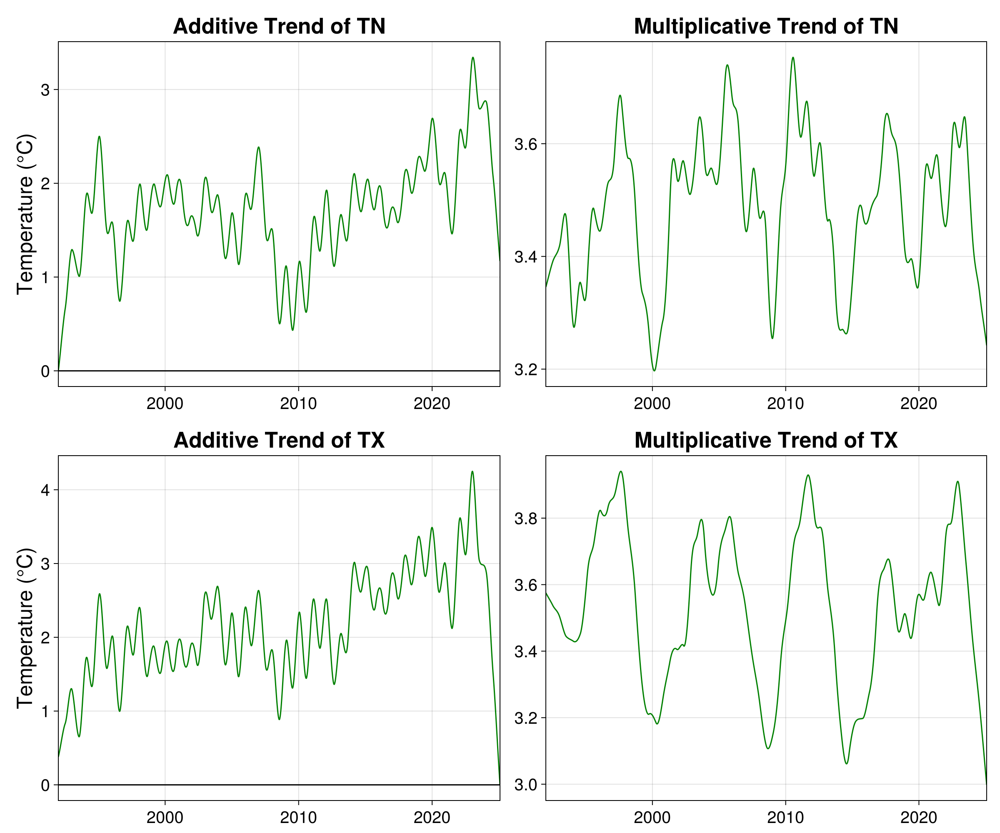

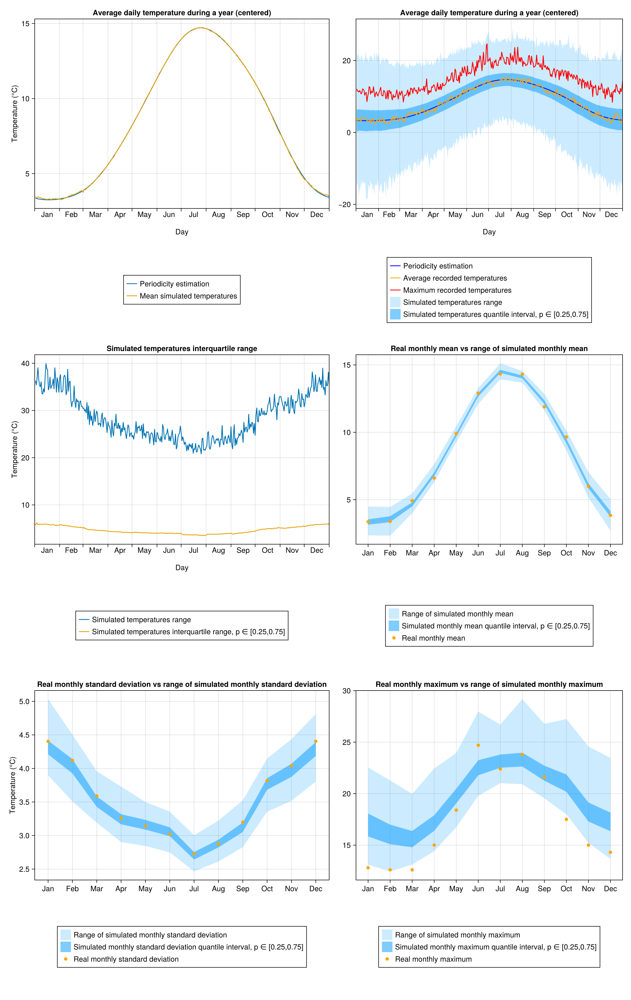

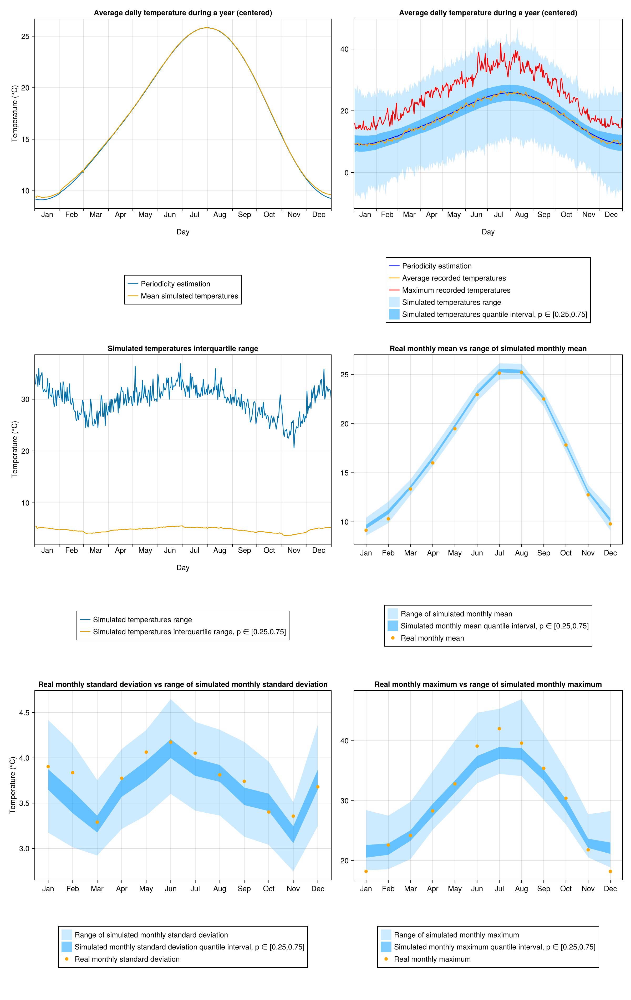

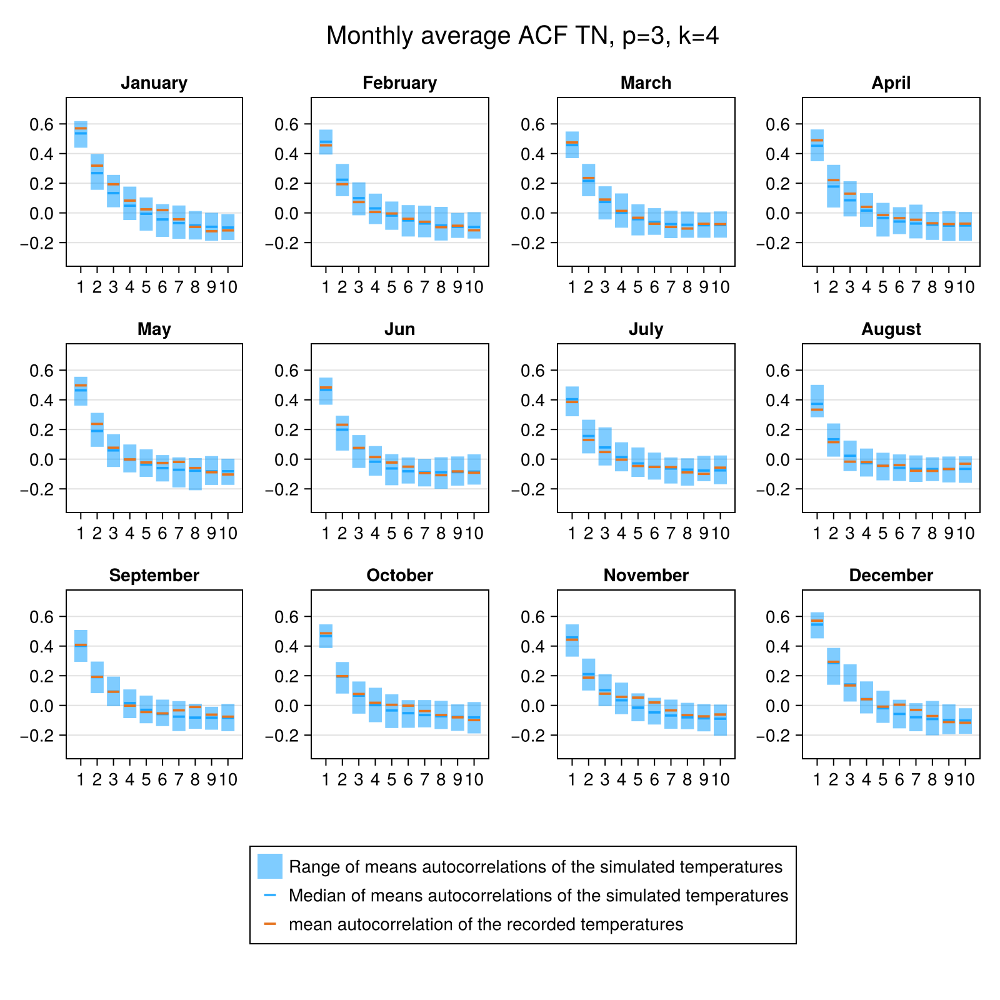

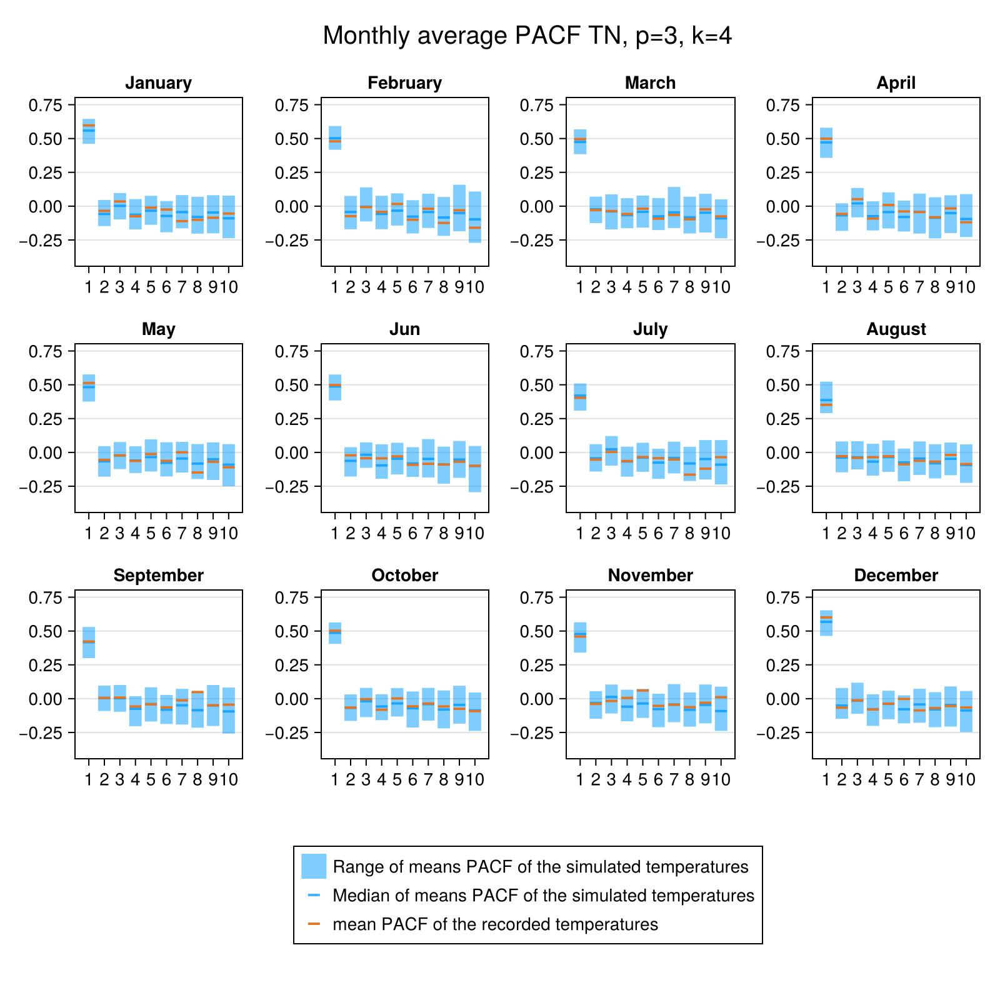

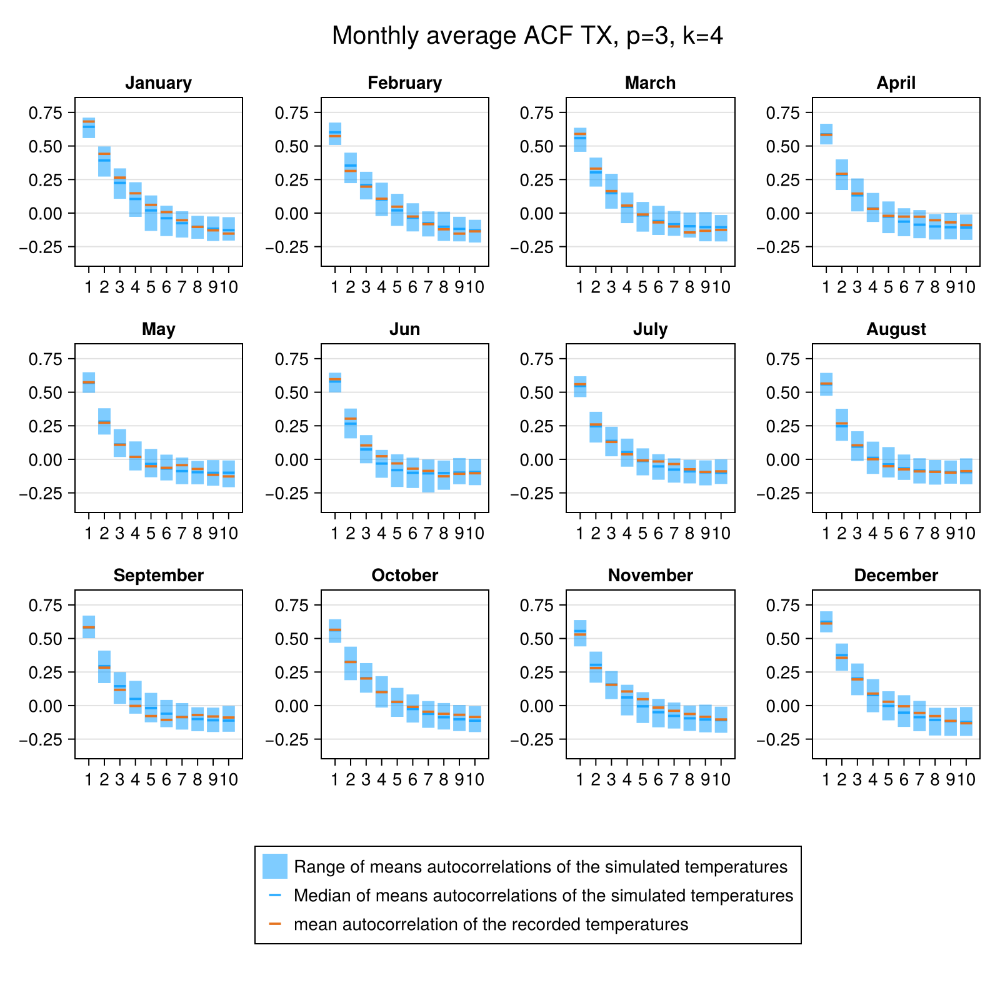

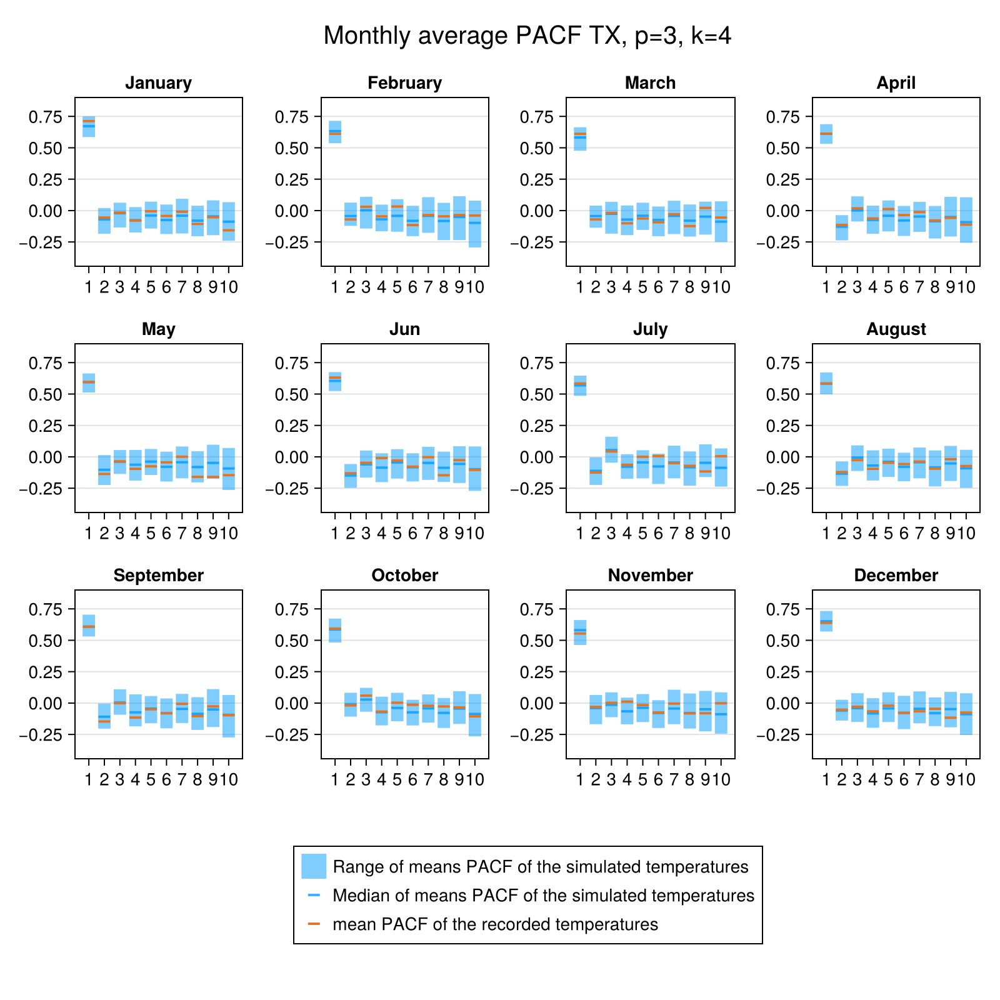

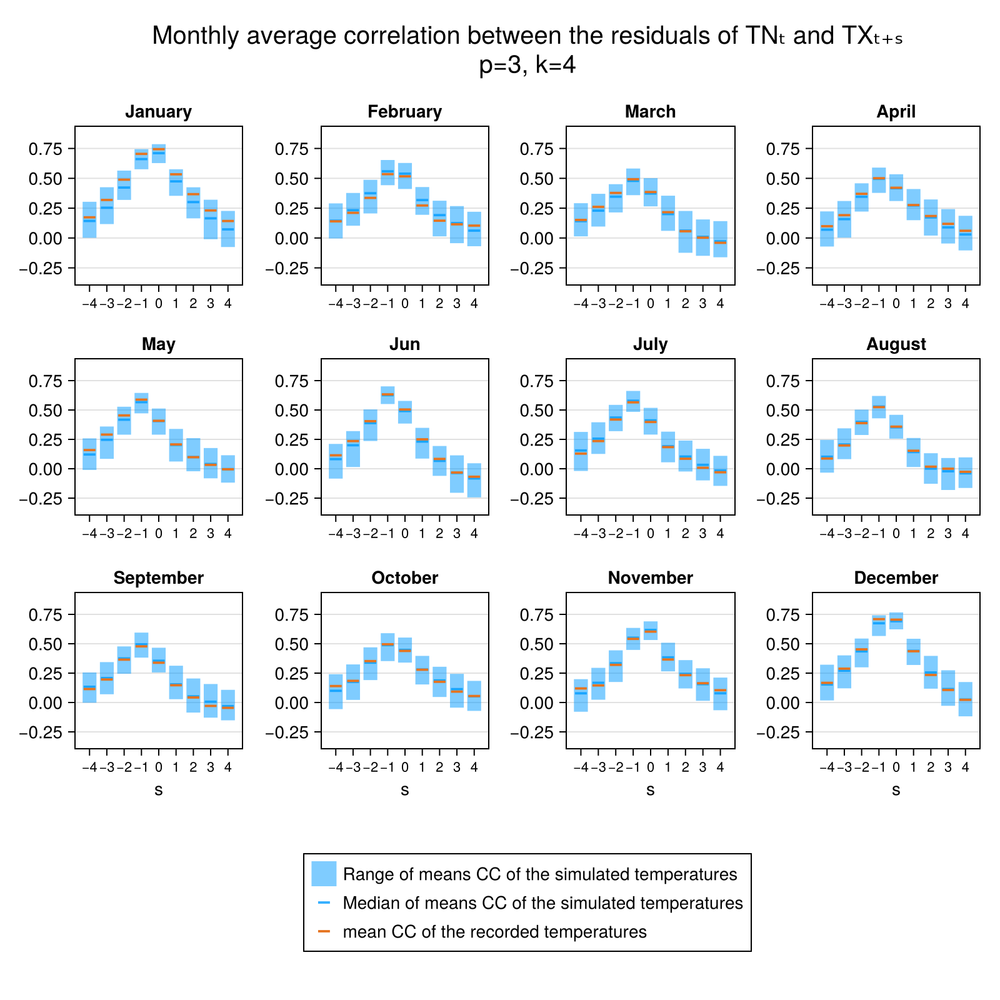

Number of scenarios with dates where TN > TX 0
Percentage of scenarios with dates where TN > TX 0.0 %
Mean percentage of dates where TN > TX : 0.0 %
Median percentage of dates where TN > TX : 0.0 %


In [7]:
include("utils/Plotting.jl")
fig_tuple = Sample_diagnostic(sample_, Caracteristics_Series_vec, Model, folder=folder_results, settings=settings, TG_bool=false)
display.(fig_tuple)
println("Number of scenarios with dates where TN > TX $(sum(TN_Grt_TX.(sample_) .> 0))")
println("Percentage of scenarios with dates where TN > TX $(trunc(100*sum(TN_Grt_TX.(sample_) .> 0)/length(sample_),digits=2)) %")
println("Mean percentage of dates where TN > TX : $(trunc(100*mean(TN_Grt_TX.(sample_))/length(Model.date_vec),digits=2)) %")
println("Median percentage of dates where TN > TX : $(trunc(100*median(TN_Grt_TX.(sample_))/length(Model.date_vec),digits=2)) %")

Pour le premiers graphes (en haut à gauche) différences expliquées par les corrections